In [13]:
import numpy as np

from scipy.stats import norm

from sklearn import metrics

import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [20]:
distrs_sigma = 0.1
p_hat_teo = np.arange(0,1, 0.01)

arrows_settings = dict(
    xref = "x3", yref = "y3",
    axref = "x3", ayref = "y3",
    arrowhead = 2,
    arrowwidth = 1.5
)

def gen_0_1_distrs(diff):
    '''
        Return points for plotting two
        normal distributions with setted difference
    '''
    
    pdf_0 = norm(0.5 - diff/2, distrs_sigma).pdf(p_hat_teo)
    pdf_1 = norm(0.5 + diff/2, distrs_sigma).pdf(p_hat_teo)
    
    cdf_0 = norm(0.5 - diff/2, distrs_sigma).cdf(p_hat_teo)
    cdf_1 = norm(0.5 + diff/2, distrs_sigma).cdf(p_hat_teo)
    
    return (pdf_0, pdf_1, cdf_0, cdf_1)


def get_data(pdf_0, pdf_1, cdf_0, cdf_1):
    '''
        Return plotly data for given distributions.
    '''
    
    return [
        # pdf
        go.Scatter(
            x = p_hat_teo, y = pdf_0, 
            name = "0 distr", line_color = 'green'
        ),
        go.Scatter(
            x = p_hat_teo, y = pdf_1, 
            name = "1 distr", line_color = 'red'
        ),
        
        # roc curve
        go.Scatter(
            x = 1 - cdf_0, y = 1 - cdf_1,
            name = "ROC", line_color = 'blue',
            fill = 'tozeroy'
        ),
        
        # pdf
        go.Scatter(
            x = p_hat_teo, y = cdf_0, 
            showlegend = False, line_color = 'green',
            name = "0 distr"
        ),
        go.Scatter(
            x = p_hat_teo, y = cdf_1,
            showlegend = False, line_color = "red",
            name = "1 distr"
        )
    ]

def get_annotations(cdf_0, cdf_1):
    '''
        Return plotly annotations for given distributions.
    '''
    
    # KS stat
    distr_diff = np.abs(cdf_0 - cdf_1)
    KS_ind = np.argmax(distr_diff)
    KS = np.round(distr_diff[KS_ind], 2)
    KS_pos = p_hat_teo[KS_ind]
    
    # AUC
    auc = metrics.auc(1 - cdf_0, 1 - cdf_1)
    
    return [
        # rows
        go.layout.Annotation(
            x = KS_pos, ax = KS_pos,
            y = cdf_0[KS_ind], ay = cdf_1[KS_ind],
            **arrows_settings
        ),
        go.layout.Annotation(
            x = KS_pos, ax = KS_pos,
            y = cdf_1[KS_ind], ay = cdf_0[KS_ind],
            **arrows_settings
        ),
        # KS stat
        go.layout.Annotation(
            x = KS_pos + 0.02,
            y = (cdf_1[KS_ind] + cdf_0[KS_ind])/2,
            text = "KS = " + str(KS),
            **arrows_settings,
            showarrow = False,
            font_size = 14
        ),
        # AUC
        go.layout.Annotation(
            x = 0.6, y = 0.4,
            text = "AUC = " + str(np.round(auc, 2)),
            xref = "x2", yref = "y2",
            showarrow = False,
            font_size = 16
        )
    ]

frame_settings = {
    "frame": {
        "duration": 1, 
        "redraw": False
    },
    "mode": "immediate"
}

sliders_currentvalue = {
    "font": {"size": 20},
    "visible": True
}

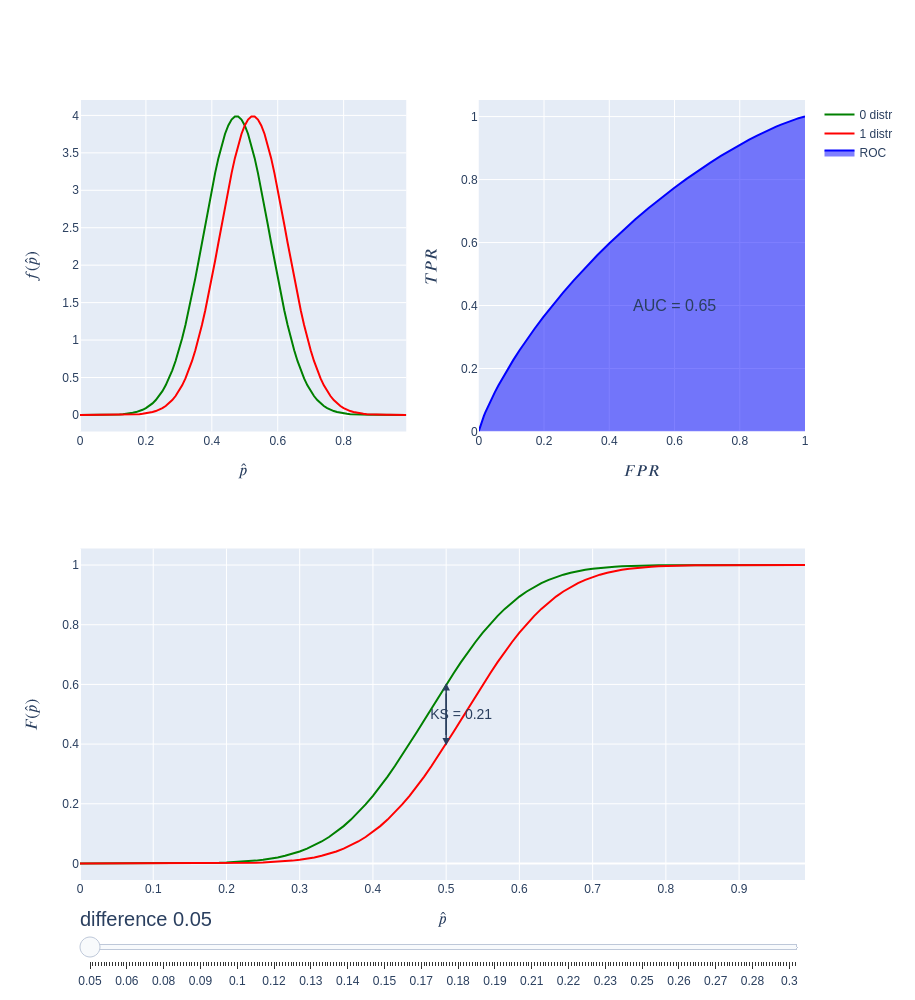

In [23]:
frames = []
steps = []

# aninations
#===============================================================
for diff in np.arange(0.05, 0.3, 0.001):
    name = str(diff)
    pdf_0, pdf_1, cdf_0, cdf_1 = gen_0_1_distrs(diff)

    frames.append(
        go.Frame(
            data = get_data(pdf_0, pdf_1, cdf_0, cdf_1),
            layout = go.Layout(annotations = get_annotations(cdf_0, cdf_1)),
            name = name
        )
    )
    
    steps.append(
        dict(
            method="animate",
            args=[
                [name],
                frame_settings
            ],
            label = str(np.round(diff, 2))
        )
    )
#===============================================================

# figure init
#===============================================================
animated_roc = make_subplots(
    rows = 2, cols = 2,
    specs=[
        [{}, {}],
        [{"colspan": 2}, None]
    ]
)
animated_roc.frames = frames
#===============================================================


# initial plot
#===============================================================
# pdf
animated_roc.append_trace(frames[0].data[0], row = 1, col = 1)
animated_roc.append_trace(frames[0].data[1], row = 1, col = 1)

# roc curve
animated_roc.append_trace(frames[0].data[2], row = 1, col = 2)

# cdf
animated_roc.append_trace(frames[0].data[3], row = 2, col = 1)
animated_roc.append_trace(frames[0].data[4], row = 2, col = 1)

# display settings
animated_roc.update_xaxes(title_text = "$\hat{p}$", row = 1 , col = 1)
animated_roc.update_yaxes(title_text = "$f(\hat{p})$", row = 1, col = 1)

animated_roc.update_xaxes(title_text = "$FPR$", row = 1, col = 2)
animated_roc.update_yaxes(title_text = "$TPR$", row = 1, col = 2)

animated_roc.update_xaxes(title_text = "$\hat{p}$", row = 2, col = 1)
animated_roc.update_yaxes(title_text = "$F(\hat{p})$", row = 2, col = 1)
#===============================================================

# layout
#===============================================================
sliders = [dict(
    steps=steps,
    currentvalue = sliders_currentvalue | {'prefix' : "difference "}
)]

animated_roc.update_layout(
    height = 1000,
    annotations = frames[3].layout.annotations,
    sliders = sliders
)
#===============================================================

animated_roc.show()